<a href="https://colab.research.google.com/github/Corprey/Bachelorarbeit/blob/main/YOLOv5n_GTSDB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to Train YOLOv5 on Custom Objects

This Colab notebook is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on the [German Traffic Sign Detection Benchmark (GTSDB) dataset](https://www.kaggle.com/datasets/safabouguezzi/german-traffic-sign-detection-benchmark-gtsdb). 

### Steps covered in this notebook

To train the detector the following steps are taken:

* Download GTSDB dataset
* Convert GTSDB dataset format to YOLOv5 format requirements
* Install YOLOv5 dependencies
* Write YOLOv5 .yaml configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



# Reminder
Remember to choose the GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU

Otherwise the current workspace will be cleared if you change it at a later point.

# Try already pretrained networks

In [ ]:
!cd /content
!mkdir /content/imgs


mkdir: cannot create directory ‘/content/imgs’: File exists


In [ ]:
from PIL import Image

def convert_ppm_to_png(ppm_file, png_file):
    img = Image.open(ppm_file)
    img.save(png_file, 'PNG')

#convert_ppm_to_png("/content/imgs/00004.ppm", "/content/imgs/00004.png")
#convert_ppm_to_png("/content/imgs/00005.ppm", "/content/imgs/00005.png")
convert_ppm_to_png("/content/imgs/00001.ppm", "/content/imgs/00001.png")




In [ ]:
# Try imported model
!cd /content
# Start the inference
!python detect.py --weights /content/best_93.pt --img 416 --conf 0.4 --source /content/imgs



Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 45, in <module>
    from models.common import DetectMultiBackend
  File "/content/yolov5/models/common.py", line 24, in <module>
    from utils.dataloaders import exif_transpose, letterbox
  File "/content/yolov5/utils/dataloaders.py", line 31, in <module>
    from utils.augmentations import (Albumentations, augment_hsv, classify_albumentations, classify_transforms, copy_paste,
ImportError: cannot import name 'classify_albumentations' from 'utils.augmentations' (/content/yolov5/utils/augmentations.py)


In [ ]:
# display inference on ALL test images
# this takes a long time

import glob
from IPython.display import Image, display
i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp5/*.png'): #assuming JPG
    if i == 20:
        break
    display(Image(filename=imageName))
    print("\n")
    i += 1

# [Optional] connect to google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Download GTSDB dataset

Download the GTSDB dataset from kaggle. For this, the user specific "kaggle.json" file has to be uploaded into the colab workspace. For more information see [Kaggle API](https://www.kaggle.com/docs/api).

In [1]:
# Path to your kaggle.json
kaggleFile = "/content/kaggle.json"

In [5]:
# Move kaggle.json to "/root/.kaggle" and set permissions
!pip install kaggle
!mkdir /root/.kaggle
!cp $kaggleFile /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [6]:
# Download dataset via API
!cd /content
!kaggle datasets download -d safabouguezzi/german-traffic-sign-detection-benchmark-gtsdb

100% 1.61G/1.61G [00:19<00:00, 81.3MB/s]
100% 1.61G/1.61G [00:19<00:00, 87.5MB/s]


In [7]:
# Unzip dataset at specified location
!mkdir /content/datasets
!mkdir /content/datasets/GTSDB
!mv /content/german-traffic-sign-detection-benchmark-gtsdb.zip /content/datasets/GTSDB
!unzip /content/datasets/GTSDB/german-traffic-sign-detection-benchmark-gtsdb.zip -d /content/datasets/GTSDB

mkdir: cannot create directory ‘/content/datasets’: File exists
mkdir: cannot create directory ‘/content/datasets/GTSDB’: File exists
Archive:  /content/datasets/GTSDB/german-traffic-sign-detection-benchmark-gtsdb.zip
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00000.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00001.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00002.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00003.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00004.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00005.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00006.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00007.ppm  
  inflating: /content/datasets/GTSDB/TestIJCNN2013/TestIJCNN2013Download/00008.ppm  
  inflating: /con

# Convert images from .ppm to .png 

In [8]:
import os
from PIL import Image

# Path to the directory containing the .ppm files
ppm_directory = '/content/datasets/GTSDB/TrainIJCNN2013/TrainIJCNN2013/'

# Path to the directory where you want to save the .png files
png_directory = '/content/datasets/GTSDB/images'

# Ensure the PNG directory exists
os.makedirs(png_directory, exist_ok=True)

# Loop through each file in the ppm directory
for filename in os.listdir(ppm_directory):
    if filename.endswith(".ppm"):
        # Open the .ppm file
        ppm_path = os.path.join(ppm_directory, filename)
        image = Image.open(ppm_path)

        # Create the .png filename
        png_filename = os.path.splitext(filename)[0] + ".png"
        png_path = os.path.join(png_directory, png_filename)

        # Save the image as .png
        image.save(png_path, "PNG")

print("Conversion complete!")

Conversion complete!


# Convert dataset format to YOLOv5 standards

To use the GTSDB dataset for training a YOLOv5 network it is necessary to convert the format of the labels. 

The GTSDB dataset uses csv format containing all labels and bounding boxes for all images. 

YOLOv5 on the other hand requires a text file for each image containing only its respective labels and bounding boxes.



In [9]:
import os
import csv


# Converts the GTSDB training labels into YOLOv5 structured labels
def convert_gtsdb_to_yolov5(gtsdb_path, labels_path, image_path):
    # Read the GTSDB annotation file
    with open(gtsdb_path, 'r') as f:
        reader = csv.reader(f,  delimiter=';')
        annotations = list(reader)

    # Clear Folder for new label data
    !rm -r $labels_path
    !mkdir $labels_path

    # Create the YOLOv5 annotation file for each annotation
    for annotation in annotations:

        # Extract the image filename from the GTSRB annotation
        image_filepath = annotation[0] 
        image_filename = image_filepath.split('.')[0]

        # Convert the GTSRB bounding box coordinates to YOLOv5 format
        box_x_center = (int(annotation[1]) + int(annotation[3])) / 2
        box_y_center = (int(annotation[2]) + int(annotation[4])) / 2
        box_width = (int(annotation[3]) - int(annotation[1])) 
        box_height = (int(annotation[4]) - int(annotation[2]))

        # Normalise the co-ordinates by the dimensions of the image
        image = Image.open(os.path.join(image_path, image_filename + ".png"))
        img_width = image.width
        img_height = image.height
        box_x_center /= img_width 
        box_y_center /= img_height 
        box_width    /= img_width 
        box_height   /= img_height 

        # Write the YOLOv5 annotation to the file
        class_id = int(annotation[5])
        with open(os.path.join(labels_path, image_filename + ".txt"), 'a+') as f:
          f.write("{} {:.3f} {:.3f} {:.3f} {:.3f}\n".format(class_id, box_x_center, box_y_center, box_width, box_height))

    print("Conversion complete.")

In [10]:
# Set relevant paths and start conversion
image_path = "/content/datasets/GTSDB/images"
gtsdb_path = "/content/datasets/GTSDB/gt.txt"
labels_path = "/content/datasets/GTSDB/labels"
convert_gtsdb_to_yolov5(gtsdb_path, labels_path, image_path)

rm: cannot remove '/content/datasets/GTSDB/labels': No such file or directory
Conversion complete.


# Split data into train and val set

In [23]:
# clean up if mistakes were made
!rm -r "/content/datasets/GTSDB/images/train"
!rm -r "/content/datasets/GTSDB/images/val"
!rm -r "/content/datasets/GTSDB/labels/train"
!rm -r "/content/datasets/GTSDB/labels/val"


In [24]:
import shutil
from random import choice

# arrays to store file names
imgs = []

# setup directory names
train_path = "/content/datasets/GTSDB/images/train"
val_path = "/content/datasets/GTSDB/images/val"

# images are initially found here
images_path = "/content/datasets/GTSDB/images"
labels_path = "/content/datasets/GTSDB/labels"

# deciding the ration in which the dataset needs to be divided
train_ratio = 0.8
val_ratio = 0.2

# total count of imgs
total_img_count = len(os.listdir(images_path))

# sorting count of imgs
for (dirname, dirs, files) in os.walk(images_path):
  for filename in files:
    imgs.append(filename)

# counting range for cycles
count_for_train = int(len(imgs) * train_ratio)
count_for_val = int(len(imgs) * val_ratio)
print("Training images are : ",count_for_train)
print("Validation images are : ",count_for_val)

Training images are :  480
Validation images are :  120


In [25]:
# creation of directories
train_image_path = "/content/datasets/GTSDB/images/train"
train_label_path = "/content/datasets/GTSDB/labels/train"
val_image_path = "/content/datasets/GTSDB/images/val"
val_label_path = "/content/datasets/GTSDB/labels/val"

if not os.path.isdir(train_image_path):
    os.makedirs(train_image_path)
if not os.path.isdir(train_label_path):
    os.makedirs(train_label_path)
if not os.path.isdir(val_image_path):
    os.makedirs(val_image_path)
if not os.path.isdir(val_label_path):
    os.makedirs(val_label_path)

In [26]:
# For training images
for x in range(count_for_train):
    file_png = random.choice(imgs)
    file_xml = file_png[:-4] + ".txt"
    
    shutil.copy(os.path.join(images_path,file_png),os.path.join(train_image_path,file_png))

    if os.path.exists(os.path.join(labels_path,file_xml)):
      shutil.copy(os.path.join(labels_path,file_xml),os.path.join(train_label_path,file_xml))
    
    imgs.remove(file_png)

In [27]:
# For validation images
for x in range(count_for_val):
    file_png = random.choice(imgs)
    file_xml = file_png[:-4] + ".txt"
    
    shutil.copy(os.path.join(images_path,file_png),os.path.join(val_image_path,file_png))
    
    if os.path.exists(os.path.join(labels_path,file_xml)):
      shutil.copy(os.path.join(labels_path,file_xml),os.path.join(val_label_path,file_xml))
    
    
    imgs.remove(file_png)

print("Remaining images : ", len(imgs))

Remaining images :  0


# Install dependencies for training YOLOv5

It is necessary to clone the YOLOv5 git repository and install the dependencies in the "requirements.txt" file provided by YOLOv5.

In [28]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 15679, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 15679 (delta 1), reused 2 (delta 0), pack-reused 15672
Receiving objects: 100% (15679/15679), 14.45 MiB | 22.97 MiB/s, done.
Resolving deltas: 100% (10746/10746), done.
/content/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [29]:
# install required dependencies
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 64.5 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Create YAML file

Training a YOLOv5 network requires a .yaml file containing information about the location of the training data, the names of the classes and the total number of classes.

In [30]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [31]:
%%writetemplate /content/datasets/GTSDB/data.yaml

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /content/datasets/GTSDB  # dataset root dir
train: /content/datasets/GTSDB/images/train  # train images (relative to 'path')
val: /content/datasets/GTSDB/images/val  # val images (relative to 'path')
#test:  /content/datasets/GTSDB/Test


# Classes (43 GTSDB classes)
nc: 43
names:
  0: Speed limit (20km/h)
  1: Speed limit (30km/h)
  2: Speed limit (50km/h)
  3: Speed limit (60km/h)
  4: Speed limit (70km/h)
  5: Speed limit (80km/h)
  6: End of speed limit (80km/h)
  7: Speed limit (100km/h)
  8: Speed limit (120km/h)
  9: No passing
  10: No passing for vehicles over 3.5 metric tons
  11: Right-of-way at the next intersection
  12: Priority road
  13: Yield
  14: Stop
  15: No vehicles
  16: Vehicles over 3.5 metric tons prohibited
  17: No entry
  18: General caution
  19: Dangerous curve to the left
  20: Dangerous curve to the right
  21: Double curve
  22: Bumpy road
  23: Slippery road
  24: Road narrows on the right
  25: Road work
  26: Traffic signals
  27: Pedestrians
  28: Children crossing
  29: Bicycles crossing
  30: Beware of ice/snow
  31: Wild animals crossing
  32: End of all speed and passing limits
  33: Turn right ahead
  34: Turn left ahead
  35: Ahead only
  36: Go straight or right
  37: Go straight or left
  38: Keep right
  39: Keep left
  40: Roundabout mandatory
  41: End of no passing
  42: End of no passing by vehicles over 3.5 metric ton

# Train YOLOv5 on GTSRB

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to the yaml file
- **cfg:** specify a custom model configuration
- **weights:** specify a custom path to weights. (Note: Weights can be downloaded from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [32]:
# train yolov5n on custom data for 30 epochs
%%time
%cd /content/yolov5/
#!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache
#!python train.py --img 32 --epochs 30 --data /content/datasets/GTSRB/data.yaml --weights yolov5n.pt --name yolov5n_results --cache
!python train.py --img 415 --batch 16 --data /content/datasets/GTSDB/data.yaml --weights yolov5n.pt --cache

/content/yolov5
2023-05-19 09:22:45.578874: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-19 09:22:46.542706: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5n.pt, cfg=, data=/content/datasets/GTSDB/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, u

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag during the training. In this case, it was named  `yolov5n_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

In [ ]:
!kill 25981

In [33]:
# Start tensorboard
# logs are saved in the folder "runs"
%load_ext tensorboard
import tensorflow as tf
import datetime

# Use the path to the current training run
%tensorboard --logdir runs/train/exp

<IPython.core.display.Javascript object>

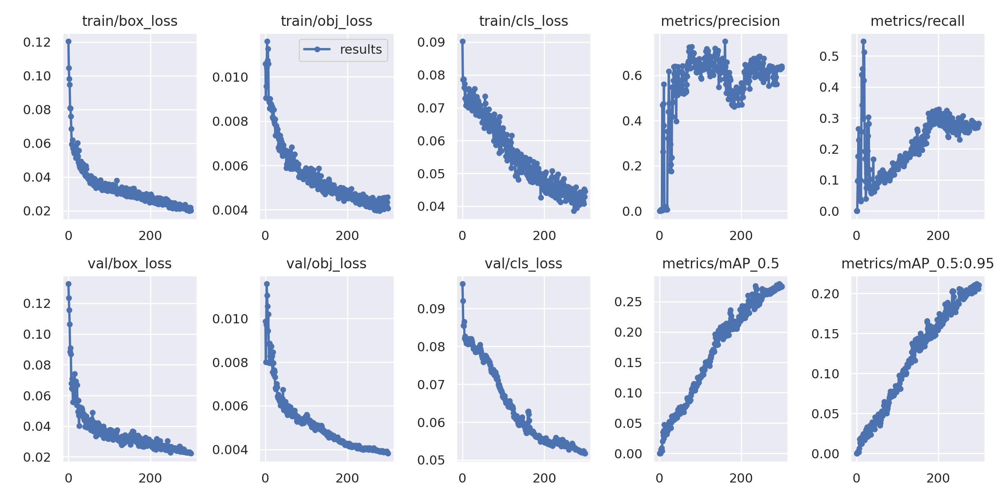

In [34]:
# One can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)  # view results.png

### Visualize Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.


GROUND TRUTH TRAINING DATA:


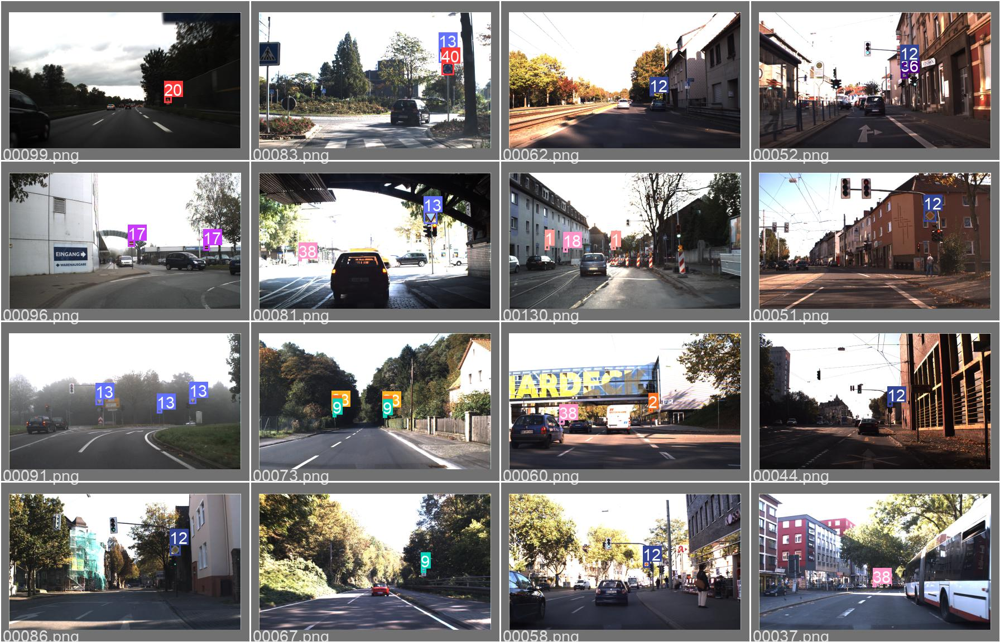

In [35]:
# first, display the ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp/val_batch2_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


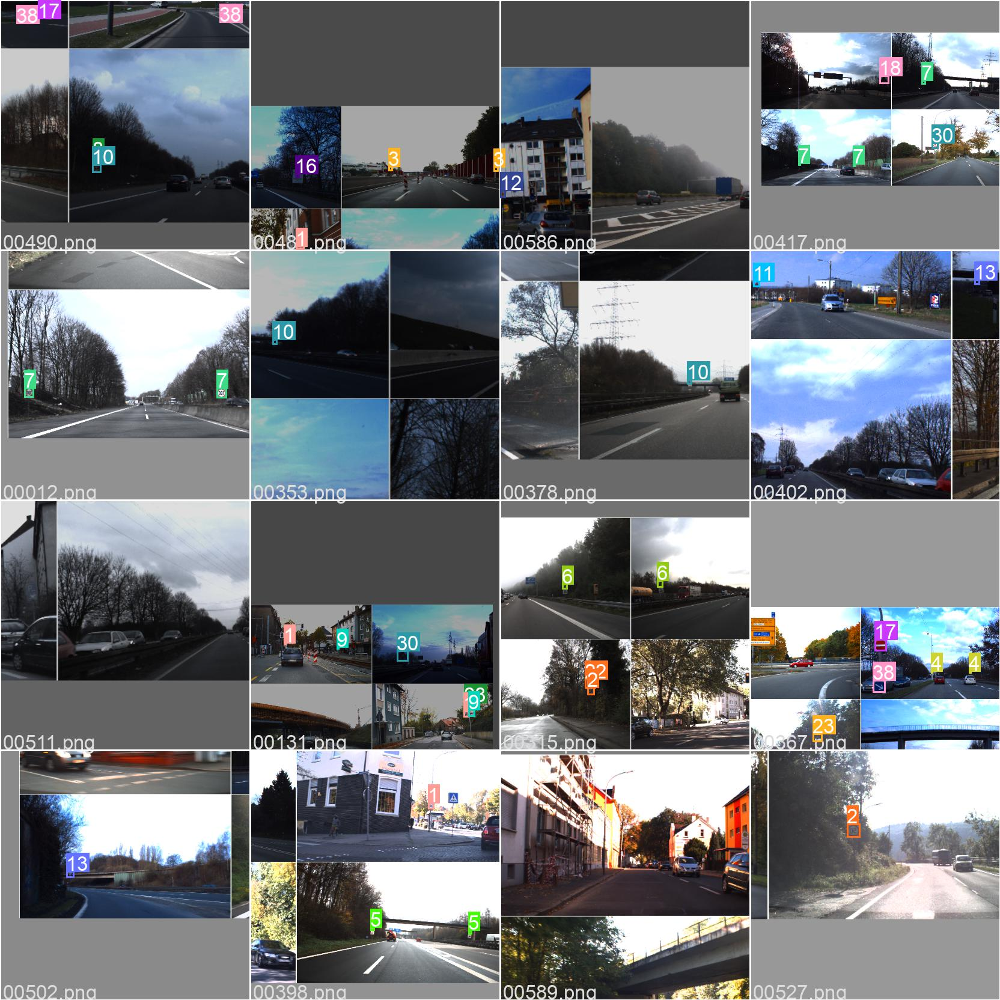

In [36]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp/train_batch2.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in the weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/exp/weights

best.pt  last.pt


In [38]:
# Start the inference
#!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source /content/datasets/GTSRB/Test
!python detect.py --source /content/datasets/GTSDB/images/val/00001.png --weights runs/train/exp/weights/best.pt --data /content/datasets/GTSDB/data.yaml --conf 0.4 

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/GTSDB/images/val/00001.png, data=/content/datasets/GTSDB/data.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 213 layers, 1817344 parameters, 0 gradients, 4.3 GFLOPs
image 1/1 /content/datasets/GTSDB/images/val/00001.png: 384x640 1 Yield, 2 Keep rights, Done. (0.042s)
Speed: 0.6ms pre-process, 41.5ms inference, 78.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


In [ ]:
# display inference on ALL test images
# this takes a long time

import glob
from IPython.display import Image, display
i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.png'): #assuming JPG
    if i == 20:
        break
    display(Image(filename=imageName))
    print("\n")
    i += 1

# Export Trained Weights for Future Inference

Now the trained weights can be exported for inference or later use.

In [39]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [40]:
%cp -r /content/yolov5/runs/train/exp /content/gdrive/My\ Drive